In [1]:
import pathlib
root_folder = pathlib.Path('/data1/Raw/UHDWallpapers')
sample_img = pathlib.Path(root_folder,'abstract-colorful-digital-art-uhdpaper.com-4K-4.1967-wp.thumbnail.jpg')

In [6]:
from matplotlib.pyplot import imshow
import numpy as np

# PIL

In [10]:
from PIL import Image

In [18]:
im = Image.open(sample_img)
resized_im = im.resize((1920, 1080))

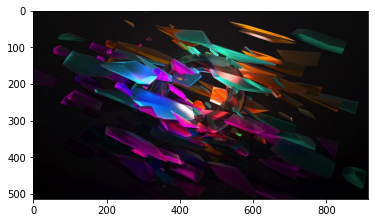

In [19]:
%matplotlib inline
imshow(np.asarray(im))

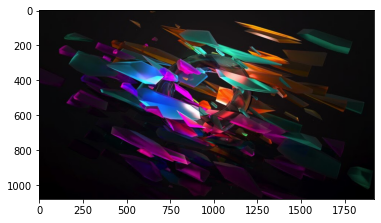

In [33]:
%matplotlib inline
imshow(np.asarray(resized_im))
np.asarray(resized_im).shape
resized_im.show()

In [46]:
resized_im.save('test0.jpg')

# OpenCV

In [27]:
import cv2 # CURRENTLY BETTER

In [29]:
img = cv2.imread(str(sample_img))
resized_image = cv2.resize(img, (1920, 1080))

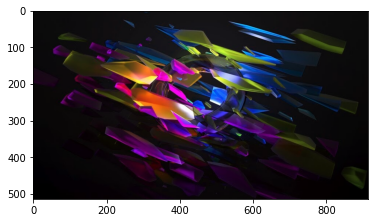

In [31]:
%matplotlib inline
imshow(np.asarray(img))

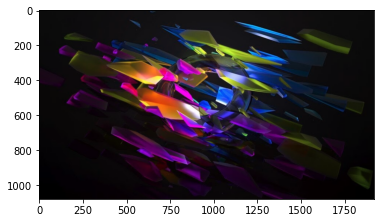

In [30]:
%matplotlib inline
imshow(np.asarray(resized_image))


In [32]:
cv2.imwrite('test.jpg', resized_image) 

True

# Scikit

In [34]:
from skimage import data
from skimage.transform import resize
from skimage import io

In [43]:
img = io.imread(str(sample_img))
resized_img = resize(img, (1080,1920))

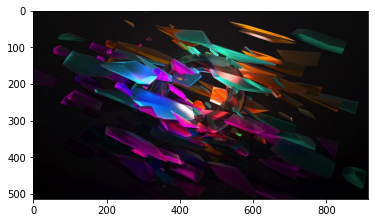

In [37]:
%matplotlib inline
imshow(np.asarray(img))

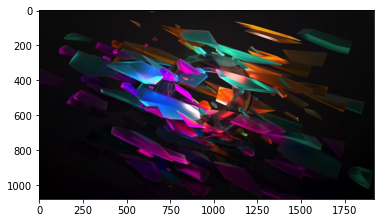

In [44]:
%matplotlib inline
imshow(np.asarray(resized_img))

In [45]:
io.imsave('test2.jpg', resized_img)

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


# Superresolution

In [2]:
import numpy as np
from PIL import Image

img = Image.open(sample_img)
lr_img = np.array(img)

10698752/10694096 [==============================] - 24s 2us/step


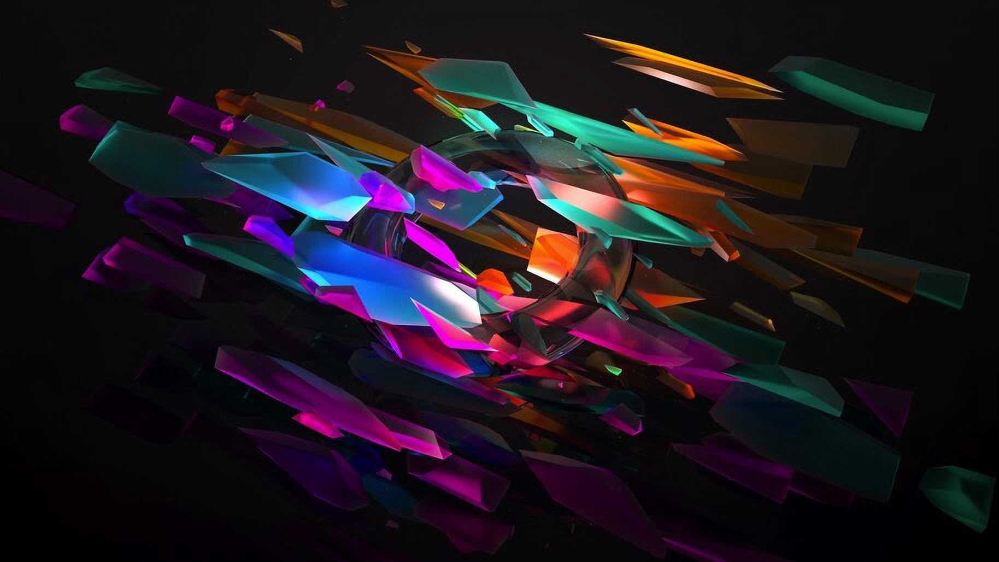

In [5]:
from ISR.models import RDN

rdn = RDN(weights='psnr-small')
sr_img = rdn.predict(lr_img)
Image.fromarray(sr_img)

In [8]:
Image.fromarray(sr_img).save('sr_img.jpg')

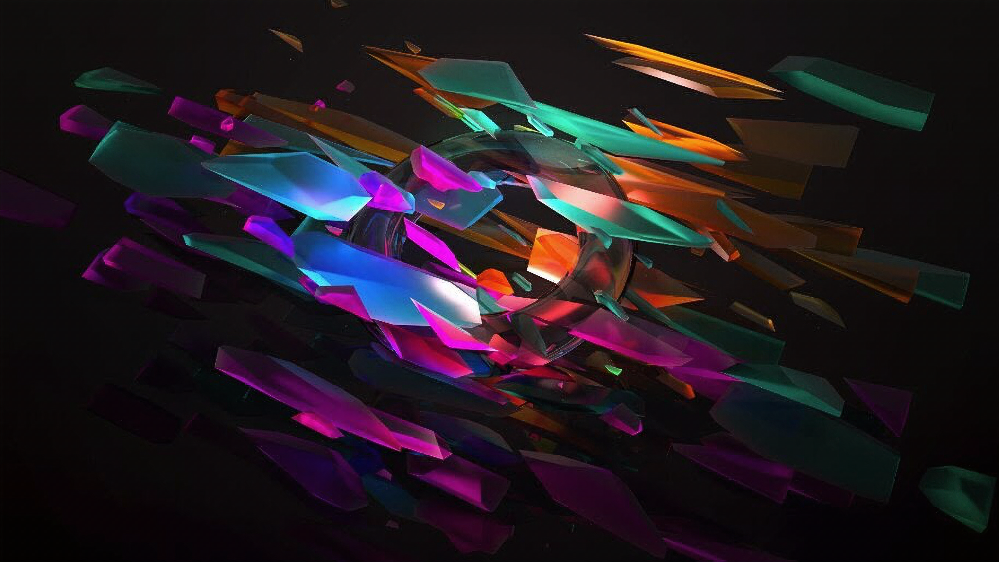

In [10]:
from ISR.models import RRDN

rrdn = RRDN(weights='gans')
sr2_img = rrdn.predict(lr_img)
Image.fromarray(sr2_img)

In [9]:
Image.fromarray(sr2_img).save('sr2_img.jpg') # BETTER VERSION

In [4]:
from ISR.models import RDN
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

# config = ConfigProto()
# config.gpu_options.allow_growth = True
# session = InteractiveSession(config=config)

rdn2 = RDN(weights='noise-cancel')
sr3_img = rdn2.predict(lr_img)
Image.fromarray(sr3_img)

UnknownError:  Failed to get convolution algorithm. This is probably because cuDNN failed to initialize, so try looking to see if a warning log message was printed above.
	 [[node generator/F_m1/Conv2D (defined at /home/andrew/anaconda3/envs/gogh-get-money/lib/python3.7/site-packages/ISR/models/imagemodel.py:59) ]] [Op:__inference_predict_function_8137]

Function call stack:
predict_function


In [17]:
Image.fromarray(sr3_img).save('sr3_img.jpg')

In [15]:
sr2_img.shape

(2056, 3656, 3)

In [1]:
import tensorflow as tf 

if tf.test.gpu_device_name(): 
    print('Default GPU Device:{}'.format(tf.test.gpu_device_name()))
else:

   print("Please install GPU version of TF")

Default GPU Device:/device:GPU:0


# Resize All Images

In [11]:
from ISR.models import RRDN
import pathlib

In [12]:
root_folder = pathlib.Path('/data1/Raw/UHDWallpapers')
out_folder = pathlib.Path('/data1/Out/UHDWallpapers')

rrdn = RRDN(weights='gans')

In [14]:
all_imgs = [img for img in root_folder.iterdir()]
print(len(all_imgs))

9852
